In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re
import matplotlib.patches as mpatches
pd.set_option("display.max_columns", None)
# pd.set_option("display.max_row", None)

Point LOMBA BIG DATA :
- Mau melihat lebih banyak dan tidaknya cyberbullying
- Mau melihat yang paling banyak terjadi cyberbullying antara individual, group,gender, physical, race, religion (bar samping, sum)
- Mau melihat yang paling tidak banyak terjadi cyberbullying antara individual, group,gender, physical, race, religion (bar samping, sum)
- Mau melihat banyak dan tidaknya cyberbullying  antara individual dan group (Barchart, sum)
- Mau melihat banyak dan tidaknya cyberbullying  antara physical dan gender (Barchart, sum)
- Mau melihat banyak dan tidaknya cyberbullying  antara race dan religion (Barchart, sum)
- Mengambil beberapa kata (Anj*ng,B1,B2,dll) lalu dianalisis yang paling banyak digunakan user, 


Noted :
- Ada tweet yang tidak termasuk bully (no), tetapi jika kata nya dibaca kembali dan dipahami merupakan bully, apakah perlu diubah dan ganti
- apakah ada ML yang bisa prediksi, memasukkan,mengganti menjadi data bully(yes)
- Yang jadi patokan itu kolom BULLY, Pemodelan ML apa yang cocok untuk digunakan?

Solution for Bullying in Twitter :
- Menggunakan fitur 'Manage Your Tweets' di menu setting sehingga kita mendapatkan alert notification (Tetap lanjut kirim atau merubah Tweet kearah yang positif) sebelum mengirim tweets yang terkadang dapat menyinggung serta menyakiti orang lain sehingga dapat dikategorikan cyberbullying.
- Jika kita yang mendapatkan cyberbullying dengan mudah kita bisa muted kata yang dianggap sebagai cyberbullying itu sendiri. dengan fitur yang telah disediakan oleh twitter yakni 'Muted Words'. Fitur ini memungkinkan pengguna untuk muted kata-kata yang tidak ingin dia lihat di home ataupun kolom comment tweet nya. Dengan hanya memasukkan katanya dan ini bersifat case-insensitive, serta untuk periode mute berlaku selamanya (kecuali pengguna menghapus). Terlebihnya lagi, pengguna dapat melihat user manakah yang katanya terkena muted di menu setting.

Variabel dalam data dijelaskan sebagai berikut :
- Bully : tweet tersebut termasuk masuk ke cyberbullying atau tidak (yes or no)
- Tweet : isi dari tweet
- Individual : tweet tersebut adalah cyberbullying yang ditunjukkan untuk individual (0= tidak, 1= iya)
- Group : tweet tersebut adalah cyberbullying yang ditunjukkan untuk kelompok orang (0= tidak
, 1= iya)
- Gender : tweet tersebut adalah cyberbullying yang berdasarkan gender atau mengutuk sesorang menggunakan kata-kata yang berhubungan dengan gender (0= tidak , 1= iya)
- Physical : tweet tersebut adalah cyberbullying yang berdasarkan kepada perbedaan bentuk fisik atau disabilitas (0= tidak , 1= iya)
- Race : tweet tersebut adalah cyberbullying yang berdasarkan etnis (0= tidak , 1= iya)
- Religion : tweet tersebut adalah cyberbullying yang berdasarkan agama, organisasi agama, atau keyakinan tertentu (0= tidak , 1= iya)
Dengan menggunakan data dan informasi yang tersedia, lakukanlah proses analisis pada data dengan menggunakan metode yang sesuai (mencakup pembuatan essai singkat dan pengolahan data).

In [2]:
df = pd.read_csv('data.csv')

# Mengubah value 'no' dan 'yes' (Object) dikolom bully menjadi 0 dan 1 (int) 
#### (Jika diperlukan)

In [3]:
# df["bully"] = df['bully'].replace({"no": 0,"yes":1})
df

,bully,tweet,individual,group,gender,physical,race,religion
0,no,USER terimakasih Ustadz sudah bersuara tentang...,0,0,0,0,0,0
1,no,USER USER Maaf sebenarnya twiter pertama kali ...,0,0,0,0,0,0
2,yes,USER Anjing tai goblok idiot bangsat monyet ba...,1,0,1,1,0,0
3,no,"Hadiri Lokakarya Kebudayaan Daerah, Bupati Rup...",0,0,0,0,0,0
4,yes,USER USER USER yg kaya gini layak di tangkap.,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...
10530,yes,USER USER USER kyak dah lahir aja ngomong soeh...,0,1,0,0,0,0
10531,yes,USER USER USER USER USER Pencitraan Lu...ah......,1,0,0,0,0,0
10532,yes,USER USER USER USER USER cebong doang yg tukan...,0,1,0,0,0,0
10533,yes,USER BIASA LAH PROF KAUM KAMBING BENGEK YA BEG...,0,1,0,0,0,0


# Memisah dataframe menjadi tweet yang bully dan bukan bully

#### Mempermudah saat preprocessing data-nya

In [4]:
pd.set_option("display.max_row", None)
df_bukan_bully = df[df["bully"] == "no"]
df_bukan_bully.reset_index(drop = True, inplace = True)
df_bully = df[df["bully"] == "yes"]
df_bully.reset_index(drop = True, inplace = True)
df_bully

,bully,tweet,individual,group,gender,physical,race,religion
0,yes,USER Anjing tai goblok idiot bangsat monyet ba...,1,0,1,1,0,0
1,yes,USER USER USER yg kaya gini layak di tangkap.,1,0,0,0,0,0
2,yes,ini namanya memancing konflik horizontal kalo ...,1,0,0,0,0,0
3,yes,Smartfren jaringan nya kok brengsek ya ...',0,1,0,0,0,0
4,yes,"USER USER Pret.. kampret , Tak dukung 2019 gan...",1,0,0,0,0,0
5,yes,USER Ahelah sombong bener punuk onta',1,0,0,0,0,0
6,yes,USER USER USER USER USER si cebong sudah keban...,0,1,0,0,0,0
7,yes,Apalagi mereka partai koalisi pendukung pemeri...,0,1,0,0,1,0
8,yes,USER terus bisa apa kalo iya....rejim kunyuk i...,0,1,0,0,0,0
9,yes,- lipstick di sapu tangan Bora. Dan diriku da...,1,0,1,0,0,0


# Mau melihat banyak dan tidaknya cyberbullying

In [5]:
Insight_1 = df['bully'].value_counts()
Insight_1

no     6114
yes    4421
Name: bully, dtype: int64

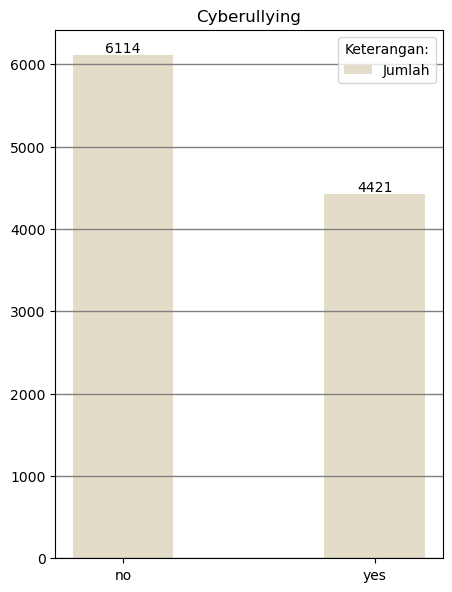

In [6]:
fig, ax = plt.subplots(figsize=(5,7), dpi = 100)

Dua = ax.bar(Insight_1.index,Insight_1, width=0.4, color = ["#E2DCC8"])
ax.bar_label(Dua)
plt.grid(axis = 'y', linewidth=1, color='grey')
ax.set_title('Cyberullying')

ax.legend(["Jumlah"],title = "Keterangan:", loc = 'upper right')
plt.show()

Insight pertama yang didapatkan adalah untuk mengetahui banyaknya tweet yang termasuk dalam golongan cyberbullying atau bukan. Dengan mengambil kolom bully pada dataframe dan dicari berapa banyak value dari masing2 uniquenya, kami menggunakan syntax `df['bully'].value_counts()`. 

Dapat disimpulkan, lebih banyak tweet yang dinyatakan tidak cyberbullying dari pada cyberbullyingnya. untuk cyberbullying ada 4421 tweet, dan yang dianggap tidak ada 6114.

# Mau melihat yang paling banyak terjadi cyberbullying antara individual, group, gender, physical, race, religion (bar samping, sum)

In [7]:
Insight_2 = df.groupby(['bully'])['individual', 'group', 'gender', 'physical', 'race',
       'religion'].sum()

Insight_2 = Insight_2.loc['yes']

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


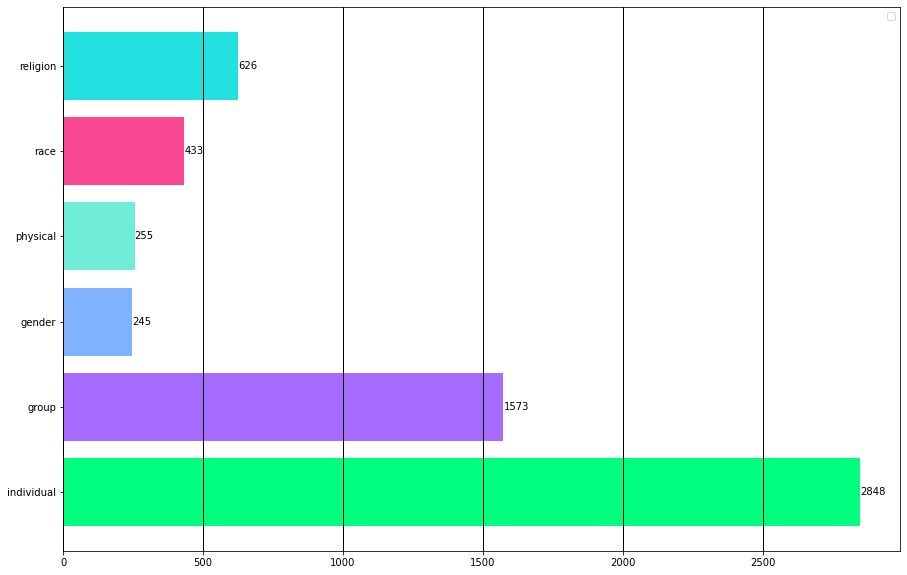

In [8]:
fig, ax = plt.subplots( figsize=(15,10))

Insight_2_Grafik = ax.barh(Insight_2.index,Insight_2, color = ["springgreen","#A66CFF",'#80B3FF','#6FEDD6','#F94892','#21E1E1'])
ax.bar_label(Insight_2_Grafik)
plt.grid(axis = 'x', linewidth=1, color='black')
plt.legend()

Insight kedua yang didapatkan adalah untuk mengetahui yang paling banyak terjadi cyberbullying antara individual, group, gender, physical, race, religion. Dengan cara mengelompokkan data yang ada pada kolom-kolom dataframe dan menggunakan patokan bully sebagai indexnya, lalu kami ambil yang hanya bernilai 'yes' saja. Dimana hal tersebut kami lakukan dengan menggunakan syntax `df.groupby(['bully'])['individual', 'group', 'gender', 'physical', 'race','religion'].sum()`. lalu kami menggunakan loc yang berupa `Insight_2.loc['yes']` agar hanya terambil yang tweet bernilai cyberbullying-nya saja.

pada kesimpulan kami, memutuskan untuk membagi cyberbullying berdasarkan dua kategori, pertama berdasarkan golongan-nya yakni `individual atau group`, dan berdasarkan jenisnya yakni `phsycal, gender, religion dan race`.Jika dilihat pada grafik yang telah ada di atas bahwa jenis cyberbullying yang banyak terjadi adalah pada jenis cyberbullying yang mengarah ke 'religion' dan untuk golongannya banyak terjadi pada suatu individual. terlihat untuk nilainya sendiri, pada bagian individual terjadi sebanyak 2848 tweet dan untuk religion terjadi sebanyak 626.

# Melihat banyaknya bully-an yang ditunjukkan ke individual dan group berdasarkan jenis bully-an

In [9]:
Insight_3 = df_bully.groupby(['individual'])['gender', 'physical', 'race','religion'].sum()
Insight_3_Group = Insight_3.loc[(0)]
Insight_3_Individual = Insight_3.loc[(1)]
Insight_3

,gender,physical,race,religion
individual,,,,
0,46,35,317,412
1,199,220,116,214


In [10]:
Insight_3_Individual

gender      199
physical    220
race        116
religion    214
Name: 1, dtype: int64

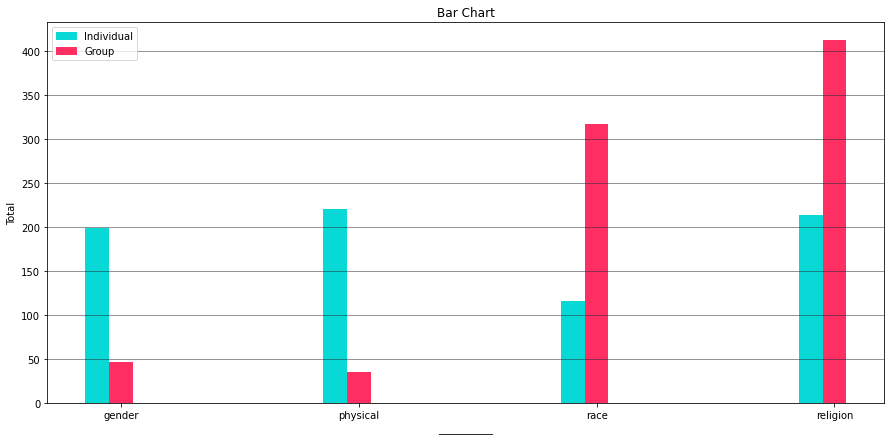

In [11]:
plt.figure(figsize=(15,7))

c=['#08D9D6','#FF2E63']
width = 0.1
plt.bar(np.arange(len(Insight_3_Individual)), Insight_3_Individual, width=width, color=c[0])
plt.bar(np.arange(len(Insight_3_Group))+ width, Insight_3_Group, width=width, color=c[1])


plt.xticks(np.arange(len(Insight_3_Individual))+ width,Insight_3_Individual.index,horizontalalignment='center')
plt.xlabel('___________')
plt.ylabel('Total')
plt.title('Bar Chart')
plt.grid(axis = 'y', linewidth=0.5, color='#252A34')


r1 = mpatches.Patch(color='#08D9D6',label='Individual')
r2 = mpatches.Patch(color='#FF2E63',label='Group')
plt.legend(handles=[r1,r2])

plt.show()

Insight ketiga yang didapatkan adalah untuk mengetahui banyaknya bully-an yang ditunjukkan ke individual dan group berdasarkan jenis bully-an. Kami menggunakan `df_bully.groupby(['individual'])['gender', 'physical', 'race', 'religion'].sum()` dan menentukan kolom individual sebagai indexing dan sisanya adalah kolom jenis-jenis cyberbullying pada bagian kolom nya. sehingga terbagi menjadi dua bagian yakni individual yang bervalue 0 dan 1. dimana jika bervalue 0 maka itu artinya adalah group, dan bervalue satu itu artinya individual.

Dapat disimpulkan dari grafik yang ada, bahwa untuk golongan individual lebih banyak mengarah kepada suatu cyberbullying yang berjenis phsycal, dan untuk golongan group lebih banyak mengarah ke religion

# Mau melihat banyak dan tidaknya cyberbullying antara Physical dan Gender (Barchart, sum)

In [12]:
Insight_4 = df_bully.groupby('bully')['physical', 'gender'].sum()
Bully_Physical_Gender = Insight_4.loc[('yes')]
Bully_Physical_Gender

physical    255
gender      245
Name: yes, dtype: int64

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


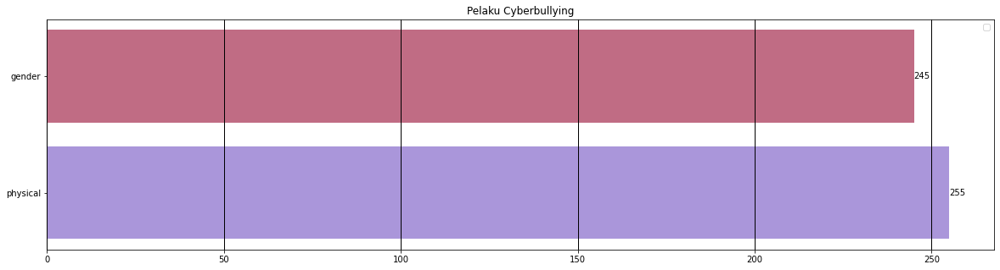

In [13]:
fig, ax = plt.subplots(figsize=(20,5))

Bully_Physical_Gender_Grafik = ax.barh(Bully_Physical_Gender.index,Bully_Physical_Gender, color = ['#AA96DA','#C06C84'])
ax.bar_label(Bully_Physical_Gender_Grafik)
plt.grid(axis = 'x', linewidth=1, color='black')
plt.title('Pelaku Cyberbullying')
plt.legend()

Insight keempat yang didapatkan adalah untuk melihat banyak dan tidaknya cyberbullying antara Physical dan Gender. Kami menggunakan `df_bully.groupby('bully')['physical', 'gender'].sum()`.

Dapat disimpulkan dari grafik yang ada, bahwa jenis bullying yang lebih banyak antara keduanya adalalah cyberbullying berjenis physical dengan 255 tweet, dan untuk gender ada 245 tweet.

# Mau melihat banyak dan tidaknya cyberbullying antara Race dan Religion (Barchart, sum)

In [14]:
Insight_5 = df_bully.groupby('bully')['race','religion'].sum()
Bully_Race_Religion = Insight_5.loc[('yes')]
Bully_Race_Religion

race        433
religion    626
Name: yes, dtype: int64

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


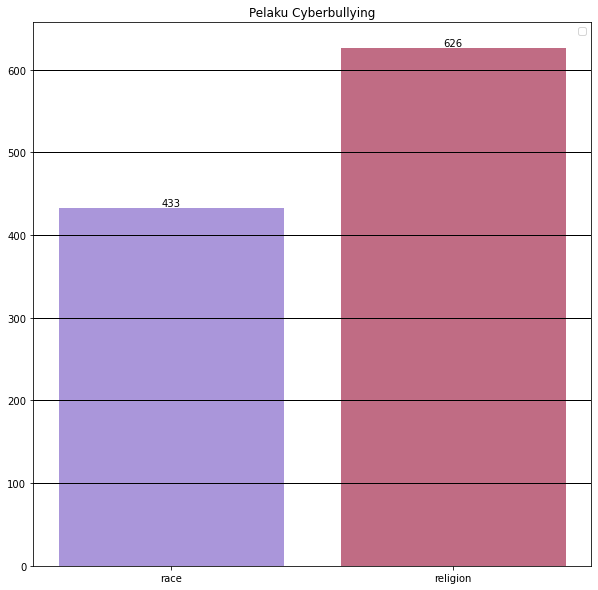

In [15]:
fig, ax = plt.subplots(figsize=(10,10))

Bully_Race_Religion_Grafik = ax.bar(Bully_Race_Religion.index,Bully_Race_Religion, color = ['#AA96DA','#C06C84'])
ax.bar_label(Bully_Race_Religion_Grafik)
plt.grid(axis = 'y', linewidth=1, color='black')
plt.title('Pelaku Cyberbullying')
plt.legend()

Insight kelima yang didapatkan adalah untuk melihat banyak dan tidaknya cyberbullying antara Race dan Religion. Kami menggunakan `df_bully.groupby('bully')['race','religion'].sum()`.

Dapat disimpulkan dari grafik yang ada, bahwa jenis bullying yang lebih banyak antara keduanya adalalah cyberbullying berjenis religion dengan 626 tweet, dan untuk race ada 433 tweet.

# Prepossessing​ Text

In [16]:
import nltk
from nltk.tokenize import WordPunctTokenizer

In [17]:
df.head()

,bully,tweet,individual,group,gender,physical,race,religion
0,no,USER terimakasih Ustadz sudah bersuara tentang...,0,0,0,0,0,0
1,no,USER USER Maaf sebenarnya twiter pertama kali ...,0,0,0,0,0,0
2,yes,USER Anjing tai goblok idiot bangsat monyet ba...,1,0,1,1,0,0
3,no,"Hadiri Lokakarya Kebudayaan Daerah, Bupati Rup...",0,0,0,0,0,0
4,yes,USER USER USER yg kaya gini layak di tangkap.,1,0,0,0,0,0


In [18]:
# Fungsi yang ditentukan pengguna untuk membersihkan pola teks yang tidak diinginkan dari semua tweet
# input - teks untuk dibersihkan, pola untuk diganti
def cleantext(inputword,pattern):
    r = re.findall(pattern=pattern,string=inputword)
    for i in r:
        inputword = re.sub(pattern=i,repl='',string=inputword)
    return inputword

In [19]:
# input - teks untuk dibersihkan, pola untuk diganti

df['cleanedText'] = np.vectorize(cleantext)(df['tweet'],'USER')
df['cleanedText']

0         terimakasih Ustadz sudah bersuara tentang Rad...
1          Maaf sebenarnya twiter pertama kali dbuat bu...
2         Anjing tai goblok idiot bangsat monyet babi f...
3        Hadiri Lokakarya Kebudayaan Daerah, Bupati Rup...
4                           yg kaya gini layak di tangkap.
5        ini namanya memancing konflik horizontal kalo ...
6              Wonu oppa kenapa matanya sipit banget? '^'"
7              Smartfren jaringan nya kok brengsek ya ...'
8          Pret.. kampret , Tak dukung 2019 ganti presi...
9                         Ahelah sombong bener punuk onta'
10                                     jancuk kw zonk!!!!'
11       Bawaslu: Kolaka Tertinggi Pelanggaran ASN Dala...
12       untung2an dan jangan sampai kami ngaku Komunis...
13            si cebong sudah kebanyakan makan tahi jok...
14       RT : Butuh cowo kontol gede yg bs angetin dimu...
15       Apalagi mereka partai koalisi pendukung pemeri...
16        terus bisa apa kalo iya....rejim kunyuk ini s.

In [20]:
df['cleanedText'] = df['cleanedText'].str.replace("[^a-zA-Z#]"," ")


In [21]:
df['cleanedText'] = df['cleanedText'].str.replace(r'\b(\w{1,2})\b', ' ')


In [22]:
#Tokenize the tweets
tokenized_tweets = df['cleanedText'].apply(lambda x:x.split())
tokenized_tweets.head()

0    [terimakasih, Ustadz, sudah, bersuara, tentang...
1    [Maaf, sebenarnya, twiter, pertama, kali, dbua...
2    [Anjing, tai, goblok, idiot, bangsat, monyet, ...
3    [Hadiri, Lokakarya, Kebudayaan, Daerah, Bupati...
4                         [kaya, gini, layak, tangkap]
Name: cleanedText, dtype: object

In [23]:
from nltk.stem.porter import * 

#Stemming kata-kata untuk menghilangkan kata-kata dengan arti yang sama
stemmer = PorterStemmer()
tokenized_tweets = tokenized_tweets.apply(lambda x : [stemmer.stem(i) for i in x])
tokenized_tweets

0        [terimakasih, ustadz, sudah, bersuara, tentang...
1        [maaf, sebenarnya, twiter, pertama, kali, dbua...
2        [anj, tai, goblok, idiot, bangsat, monyet, bab...
3        [hadiri, lokakarya, kebudayaan, daerah, bupati...
4                             [kaya, gini, layak, tangkap]
5        [ini, namanya, memanc, konflik, horizont, kalo...
6             [wonu, oppa, kenapa, matanya, sipit, banget]
7                [smartfren, jaringan, nya, kok, brengsek]
8        [pret, kampret, tak, dukung, ganti, presiden, ...
9                    [ahelah, sombong, bener, punuk, onta]
10                                          [jancuk, zonk]
11       [bawaslu, kolaka, tertinggi, pelanggaran, asn,...
12       [untung, dan, jangan, sampai, kami, ngaku, kom...
13       [cebong, sudah, kebanyakan, makan, tahi, jokow...
14       [butuh, cowo, kontol, gede, angetin, dimusim, ...
15       [apalagi, mereka, partai, koalisi, pendukung, ...
16       [teru, bisa, apa, kalo, iya, rejim, kunyuk, in.

In [24]:
#Joining the tokenized tweets

for i in range(len(tokenized_tweets)):
    tokenized_tweets[i] = ' '.join(tokenized_tweets[i])    
df['cleanedText'] = tokenized_tweets
df.head()

,bully,tweet,individual,group,gender,physical,race,religion,cleanedText
0,no,USER terimakasih Ustadz sudah bersuara tentang...,0,0,0,0,0,0,terimakasih ustadz sudah bersuara tentang radi...
1,no,USER USER Maaf sebenarnya twiter pertama kali ...,0,0,0,0,0,0,maaf sebenarnya twiter pertama kali dbuat buka...
2,yes,USER Anjing tai goblok idiot bangsat monyet ba...,1,0,1,1,0,0,anj tai goblok idiot bangsat monyet babi fucc ...
3,no,"Hadiri Lokakarya Kebudayaan Daerah, Bupati Rup...",0,0,0,0,0,0,hadiri lokakarya kebudayaan daerah bupati rupi...
4,yes,USER USER USER yg kaya gini layak di tangkap.,1,0,0,0,0,0,kaya gini layak tangkap


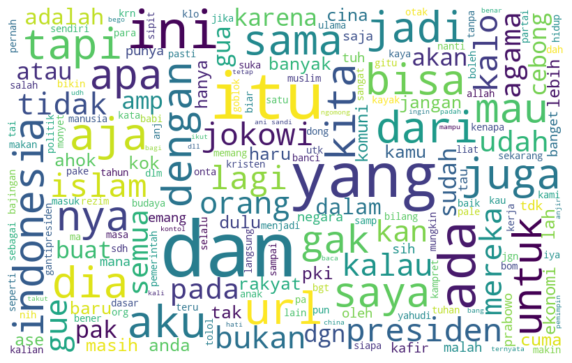

In [25]:
from wordcloud import WordCloud
# Membuat Word Cloud untuk semua Kata di semua tweet
allWords = ' '.join([text for text in df['cleanedText']])
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110,background_color="white").generate(allWords)
plt.figure(figsize=(10, 10)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis('off') 
plt.show()

# nb: semakin besar kata yang ditampilkan maka semakin sering kata itu muncul.

# Memisahkan dataframe berdasarkan jenis cyberbullying-nya dan mengambil berapa banyak kata yang sering diucapkan lalu ditampilkan kedalam wordcloud.

In [26]:
# Memisahkan antara golongan tweet dan jenisnya menjadi sebuah dataframe.

Individu = df[df["individual"] == 1]
Group = df[df["group"] == 1]
Gender = df[df["gender"] == 1]
Physical = df[df["physical"] == 1]
Race = df[df["race"] == 1]
Religion = df[df["religion"] == 1]
Individu

,bully,tweet,individual,group,gender,physical,race,religion,cleanedText
2,yes,USER Anjing tai goblok idiot bangsat monyet ba...,1,0,1,1,0,0,anj tai goblok idiot bangsat monyet babi fucc ...
4,yes,USER USER USER yg kaya gini layak di tangkap.,1,0,0,0,0,0,kaya gini layak tangkap
5,yes,ini namanya memancing konflik horizontal kalo ...,1,0,0,0,0,0,ini namanya memanc konflik horizont kalo polis...
8,yes,"USER USER Pret.. kampret , Tak dukung 2019 gan...",1,0,0,0,0,0,pret kampret tak dukung ganti presiden preside...
9,yes,USER Ahelah sombong bener punuk onta',1,0,0,0,0,0,ahelah sombong bener punuk onta
17,yes,- lipstick di sapu tangan Bora. Dan diriku da...,1,0,1,0,0,0,lipstick sapu tangan bora dan diriku dalam hat...
19,yes,USER Iya sih kek komunis banget wkwkwk',1,0,0,0,1,0,iya sih kek komuni banget wkwkwk
26,yes,Pak de USER akan lebih elegan klo sampean unda...,1,0,0,0,0,0,pak akan lebih elegan klo sampean undang para ...
27,yes,USER USER Rak harusnya lo tau kalau temen teme...,1,0,0,0,0,0,rak harusnya tau kalau temen temen itu pinter ...
29,yes,USER USER USER mabuk pil PCC,1,0,0,0,0,0,mabuk pil pcc


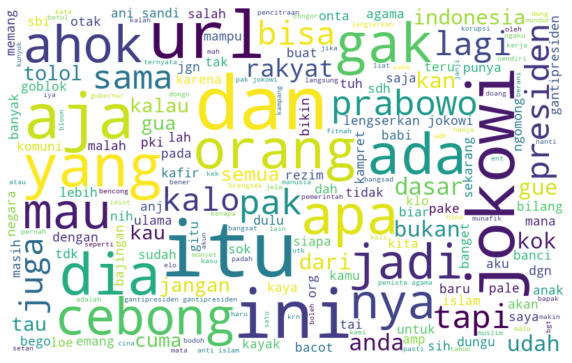

In [27]:
# Membuat Word Cloud untuk semua Kata dalam cyberbullying Tweet individu

allWords = ' '.join([text for text in Individu['cleanedText']])
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110,background_color="white").generate(allWords)
plt.figure(figsize=(10, 10)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis('off') 
plt.show()

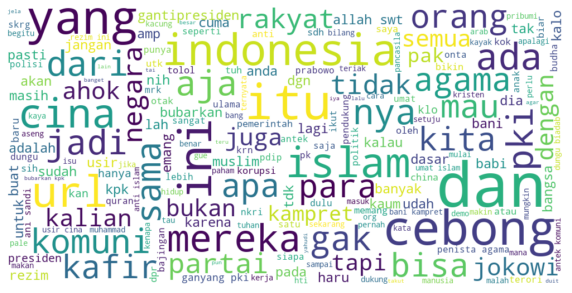

In [28]:
# Membuat Word Cloud untuk semua Kata dalam cyberbullying Tweet Group

allWords = ' '.join([text for text in Group['cleanedText']])
wordcloud = WordCloud(width=1000, height=500, random_state=21, max_font_size=110,background_color="white").generate(allWords)
plt.figure(figsize=(10, 10)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis('off') 
plt.show()

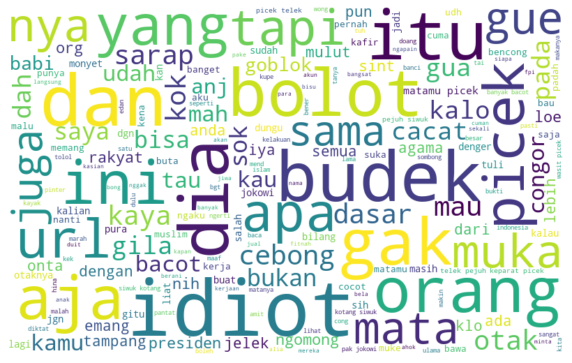

In [29]:
# Membuat Word Cloud untuk semua Kata dalam cyberbullying Tweet Physical

allWords = ' '.join([text for text in Physical['cleanedText']])
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110,background_color="white").generate(allWords)
plt.figure(figsize=(10, 10)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis('off') 
plt.show()

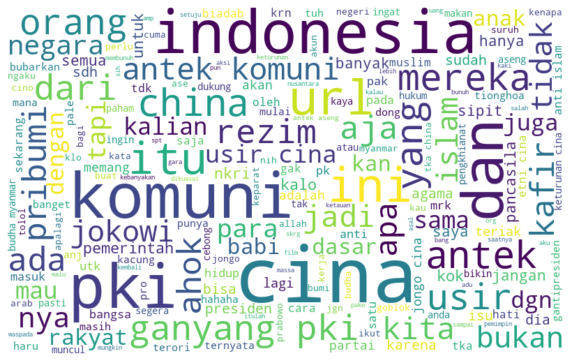

In [30]:
# Membuat Word Cloud untuk semua Kata dalam cyberbullying Tweet Race

allWords = ' '.join([text for text in Race['cleanedText']])
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110,background_color="white").generate(allWords)
plt.figure(figsize=(10, 10)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis('off') 
plt.show()

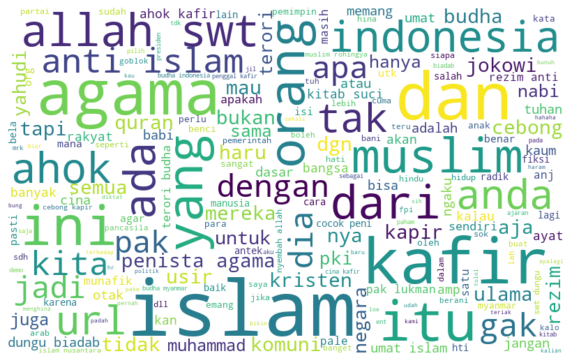

In [31]:
# Membuat Word Cloud untuk semua Kata dalam cyberbullying Tweet religion


allWords = ' '.join([text for text in Religion['cleanedText']])
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110,background_color="white").generate(allWords)
plt.figure(figsize=(10, 10)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis('off') 
plt.show()

# Mencari kata-kata kasar yang paling banyak 15 teratas.

### Proses Tokenizing [Tokenizer dan cleaning text]
##### - Tokenisasi adalah tahap pemotongan string input menjadi beberapa potongan yang disebut token berdasarkan tiap kata yang menyusunnya.

##### - Cleaning text adalah menghapus URL, username, mention, serta simbol-simbol seperti tanda tanya dan tanda seru. Data diubah ke dalam bentuk lowercase atau dikenal dengan istilah case folding karena untuk kasus prepocessing text bersifat sensitive case

In [32]:
Coba = df['cleanedText']

tk = WordPunctTokenizer()

Coba_3 = []
for i in Coba :
    coba_2 = tk.tokenize(i)
    Coba_3.append(coba_2)
    
clean_token=[]
for y in Coba_3 :
    for token in y:
        token = token.lower()
        # remove any value that are not alphabetical
        new_token = re.sub(r'[^a-zA-Z]+', '', token) 
        # remove empty value and single character value
        if new_token != "" and len(new_token) >= 2: 
            vowels=len([v for v in new_token if v in "aeiou"])
            if vowels != 0: # remove line that only contains consonants
                clean_token.append(new_token)
print(clean_token)

['terimakasih', 'ustadz', 'sudah', 'bersuara', 'tentang', 'radik', 'radik', 'ini', 'entah', 'apa', 'yang', 'ada', 'dalam', 'pikiran', 'rejim', 'mesjid', 'radik', 'kampu', 'radik', 'dosen', 'radik', 'padah', 'tempat', 'tersebut', 'pijakan', 'peradaban', 'memangnya', 'mau', 'menghancurkan', 'indonesia', 'maaf', 'sebenarnya', 'twiter', 'pertama', 'kali', 'dbuat', 'bukan', 'buat', 'orang', 'bego', 'anj', 'tai', 'goblok', 'idiot', 'bangsat', 'monyet', 'babi', 'fucc', 'kont', 'ngent', 'goblok', 'iya', 'tau', 'kasar', 'maaf', 'hadiri', 'lokakarya', 'kebudayaan', 'daerah', 'bupati', 'rupinu', 'ajak', 'masyarakat', 'sekadau', 'rawat', 'dan', 'manfaatkan', 'objek', 'budaya', 'kaya', 'gini', 'layak', 'tangkap', 'ini', 'namanya', 'memanc', 'konflik', 'horizont', 'kalo', 'polisi', 'membiarkan', 'bagian', 'dari', 'itu', 'sudah', 'waktunya', 'lengserkan', 'jokowi', 'sebelum', 'indonesia', 'hancur', 'wonu', 'oppa', 'kenapa', 'matanya', 'sipit', 'banget', 'smartfren', 'jaringan', 'nya', 'kok', 'brengse

### Proses filtering [StopWord]
##### - Stopwords merupakan kata umumyang muncul dalam jumlah besar dan dianggap tidak memiliki makna. Stopwords yang digunakan berasal dari analisis kata dasar.

##### - Library stopword yang digunakan adalah Sastrawi. Dengan import fungsi nya yakni `StopWordRemoverFactory ()`

In [33]:
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory
stop_factory = StopWordRemoverFactory()
more_stopword = ['dengan', 'ia','bahwa','oleh','dan','ini','itu','indonesia','ada','aku','untuk','tapi','mau','jadi', 'aja', 'nya', 'tak', 'gak', 'apa', 'kalo', 'pak', 'sama', 'semua', 'gue', 'kan','bukan', 'url', 'baru', 'anak', 'satu', 'punya', 'udah', 'kau', 'utk', 'kata', 'tau', 'biar', 'lebih', 'naik', 'cuma', 'mana', 'siapa', 'bilang', 'haru', 'menjadi','orang','sih','amp','kok','kalau', 'jangan', 'gua', 'buat', 'budaya', 'suka', 'lah', 'kok', 'banyak', 'ekonomi', 'kamu','jangan', 'salah', 'dulu', 'malah', 'emang', 'tuh', 'teru', 'sekarang', 'bang', 'lalu', 'hidup','memang', 'samp', 'klo', 'pernah', 'masuk', 'perlu', 'nih', 'banget', 'pale', 'manusia', 'minta', 'makan', 'mungkin', 'padah', 'tahun']
data = stop_factory.get_stop_words()+more_stopword
stopwords = stop_factory.create_stop_word_remover()
data

['yang',
 'untuk',
 'pada',
 'ke',
 'para',
 'namun',
 'menurut',
 'antara',
 'dia',
 'dua',
 'ia',
 'seperti',
 'jika',
 'jika',
 'sehingga',
 'kembali',
 'dan',
 'tidak',
 'ini',
 'karena',
 'kepada',
 'oleh',
 'saat',
 'harus',
 'sementara',
 'setelah',
 'belum',
 'kami',
 'sekitar',
 'bagi',
 'serta',
 'di',
 'dari',
 'telah',
 'sebagai',
 'masih',
 'hal',
 'ketika',
 'adalah',
 'itu',
 'dalam',
 'bisa',
 'bahwa',
 'atau',
 'hanya',
 'kita',
 'dengan',
 'akan',
 'juga',
 'ada',
 'mereka',
 'sudah',
 'saya',
 'terhadap',
 'secara',
 'agar',
 'lain',
 'anda',
 'begitu',
 'mengapa',
 'kenapa',
 'yaitu',
 'yakni',
 'daripada',
 'itulah',
 'lagi',
 'maka',
 'tentang',
 'demi',
 'dimana',
 'kemana',
 'pula',
 'sambil',
 'sebelum',
 'sesudah',
 'supaya',
 'guna',
 'kah',
 'pun',
 'sampai',
 'sedangkan',
 'selagi',
 'sementara',
 'tetapi',
 'apakah',
 'kecuali',
 'sebab',
 'selain',
 'seolah',
 'seraya',
 'seterusnya',
 'tanpa',
 'agak',
 'boleh',
 'dapat',
 'dsb',
 'dst',
 'dll',
 'dahulu

In [34]:
# Syntax untuk melakukan pembersihannya
tokens = [x for x in clean_token if x not in data]
print(tokens)

['terimakasih', 'ustadz', 'bersuara', 'radik', 'radik', 'entah', 'pikiran', 'rejim', 'mesjid', 'radik', 'kampu', 'radik', 'dosen', 'radik', 'tempat', 'tersebut', 'pijakan', 'peradaban', 'memangnya', 'menghancurkan', 'maaf', 'sebenarnya', 'twiter', 'pertama', 'kali', 'dbuat', 'bego', 'anj', 'tai', 'goblok', 'idiot', 'bangsat', 'monyet', 'babi', 'fucc', 'kont', 'ngent', 'goblok', 'iya', 'kasar', 'maaf', 'hadiri', 'lokakarya', 'kebudayaan', 'daerah', 'bupati', 'rupinu', 'ajak', 'masyarakat', 'sekadau', 'rawat', 'manfaatkan', 'objek', 'kaya', 'gini', 'layak', 'tangkap', 'namanya', 'memanc', 'konflik', 'horizont', 'polisi', 'membiarkan', 'bagian', 'waktunya', 'lengserkan', 'jokowi', 'hancur', 'wonu', 'oppa', 'matanya', 'sipit', 'smartfren', 'jaringan', 'brengsek', 'pret', 'kampret', 'dukung', 'ganti', 'presiden', 'presidenmu', 'sapa', 'rocki', 'gerung', 'kapir', 'thaa', 'ahelah', 'sombong', 'bener', 'punuk', 'onta', 'jancuk', 'zonk', 'bawaslu', 'kolaka', 'tertinggi', 'pelanggaran', 'asn', '

In [35]:
# Pengecekan dan penggabungan kata perkata yang tadinya dipisah dengan list, sekarang menjadi suatu string text utuh.

from wordcloud import WordCloud

allWords = ' '.join([text for text in tokens])
allWords

'terimakasih ustadz bersuara radik radik entah pikiran rejim mesjid radik kampu radik dosen radik tempat tersebut pijakan peradaban memangnya menghancurkan maaf sebenarnya twiter pertama kali dbuat bego anj tai goblok idiot bangsat monyet babi fucc kont ngent goblok iya kasar maaf hadiri lokakarya kebudayaan daerah bupati rupinu ajak masyarakat sekadau rawat manfaatkan objek kaya gini layak tangkap namanya memanc konflik horizont polisi membiarkan bagian waktunya lengserkan jokowi hancur wonu oppa matanya sipit smartfren jaringan brengsek pret kampret dukung ganti presiden presidenmu sapa rocki gerung kapir thaa ahelah sombong bener punuk onta jancuk zonk bawaslu kolaka tertinggi pelanggaran asn pilkada akuseruji pilkada untung ngaku komuni ngaku athei cebong kebanyakan tahi jokowi sadar jokowi mengumumkan dirubah indochina butuh cowo kontol gede angetin dimusim ujan horni ahh hawanya bikin pngen ngentot say retweet nger partai koalisi pendukung pemerintah diketahui menjalin kerjasama 

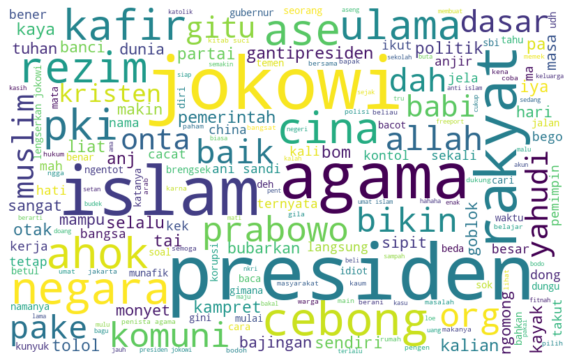

In [36]:
from wordcloud import WordCloud

# Membuat Word Cloud untuk semua Kata dalam tweet cyberbullying yang telah dibersihkan.
allWords = ' '.join([text for text in tokens])
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110,background_color="white").generate(allWords)
plt.figure(figsize=(10, 10)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis('off') 
plt.show()

In [37]:
# menggunakan import re untuk menemukan jumlah frekuensi keluar suatu kata dalam tweet yang sudah dibersihkan sebelumnya.

import re
frequency = {}
match_pattern = re.findall(r'\b[a-z]{3,15}\b', allWords)
 
for word in match_pattern:
    count = frequency.get(word,0)
    frequency[word] = count + 1
     
frequency_list = frequency.keys()
for words in frequency_list:
    print (words, frequency[words])

terimakasih 11
ustadz 27
bersuara 3
radik 40
entah 25
pikiran 23
rejim 51
mesjid 6
kampu 23
dosen 20
tempat 86
tersebut 45
pijakan 1
peradaban 7
memangnya 3
menghancurkan 8
maaf 45
sebenarnya 40
twiter 1
pertama 48
kali 122
dbuat 2
bego 93
anj 139
tai 130
goblok 124
idiot 93
bangsat 68
monyet 126
babi 174
fucc 1
kont 3
ngent 1
iya 137
kasar 25
hadiri 5
lokakarya 1
kebudayaan 10
daerah 58
bupati 23
rupinu 1
ajak 30
masyarakat 91
sekadau 1
rawat 3
manfaatkan 4
objek 3
kaya 164
gini 93
layak 25
tangkap 23
namanya 84
memanc 3
konflik 10
horizont 1
polisi 76
membiarkan 9
bagian 33
waktunya 7
lengserkan 135
jokowi 747
hancur 32
wonu 1
oppa 16
matanya 23
sipit 145
smartfren 1
jaringan 8
brengsek 87
pret 2
kampret 162
dukung 85
ganti 101
presiden 721
presidenmu 2
sapa 3
rocki 23
gerung 22
kapir 48
thaa 1
ahelah 2
sombong 25
bener 123
punuk 3
onta 191
jancuk 22
zonk 19
bawaslu 5
kolaka 3
tertinggi 8
pelanggaran 13
asn 8
pilkada 224
akuseruji 2
untung 25
ngaku 54
komuni 287
athei 7
cebong 419
ke

cocot 52
kow 3
menhindar 1
munafik 85
alia 33
kaaaaau 1
becandain 1
mamah 3
sere 51
klaim 8
program 42
sdri 3
depak 1
komunism 7
sekulerism 1
liberalism 1
hukum 83
rasulnya 1
syam 1
belajar 68
mencatut 5
kenikmatan 3
mengikuti 16
muhammad 43
bejad 24
ugh 3
gengsi 6
liedabin 2
sekali 100
diangkat 8
penyesalan 2
indo 22
yeeee 1
dibanjiri 1
tenaga 23
kren 1
top 18
seumur 7
balik 54
solo 11
papa 7
bikinin 2
ade 20
iyuh 1
papah 1
neomu 2
hadoiii 1
menyusahkan 2
menyenangkan 5
liber 35
kelak 7
akhirat 2
bantai 10
puak 1
rukun 4
jagalah 2
memusuhi 5
sahabat 19
lihat 68
kondisi 17
suriah 10
dekat 39
rusia 20
kecil 66
huruf 9
huft 3
sedih 29
restui 2
wna 3
duduki 1
jabatan 18
direksi 4
bumn 16
rizal 8
ramli 9
ampun 9
nunggu 23
reaksi 10
denni 3
siregar 2
stelah 2
cita 9
citanya 1
memenjarakan 1
tinggal 41
kenangan 4
alhamdulillah 20
berturut 3
kado 3
positif 16
unt 6
berkhidmat 1
untrakyat 1
sumbar 4
selamat 63
akh 1
warga 124
menyerukan 2
pro 60
terealisasi 2
seandainya 10
gombal 2
berangu 1
k

ganteng 25
jago 12
ngomongin 10
manga 1
nyambungnya 1
lagu 28
jeketi 1
wota 1
peristiwa 13
mei 15
refleksi 2
puncak 4
kemarahan 2
militeristik 2
maukah 1
terbukti 35
bangkrut 9
mampuuuusssssss 1
mpok 6
menuli 5
terdakwa 8
coba 79
mulia 11
cuih 4
sosialisasikan 2
sako 2
mirip 34
min 18
inflasi 7
ndak 16
sarjana 3
mencetak 3
beredar 5
nek 16
ora 9
wae 7
wong 28
yen 3
naksir 4
peduli 28
ndunyo 1
eeh 3
keliatan 28
sisi 15
kesadaran 4
tetangga 5
sebelah 21
suami 8
nguru 8
mayan 4
ninja 2
lingkunganmu 1
biarkan 10
karam 2
kapal 17
munafiknya 1
jabar 33
delet 2
indek 7
ftse 1
berakhir 6
cece 3
judul 1
pjalan 1
spanjang 1
taun 12
pkoknya 1
lakon 1
cewenya 3
dtgah 1
orgnya 5
menghindari 4
bsa 6
negarani 1
hebatlah 1
dikira 12
nyari 21
findinghyukja 1
tepatnya 5
affu 1
indosiar 2
timnasday 1
sipil 7
sediakan 3
new 6
dorong 11
inspirasi 4
road 2
harikartini 3
berhijab 7
justru 45
aurat 3
cipta 5
reka 1
menciptakan 13
bentar 16
semangat 24
oborrakyat 1
pikir 25
pimr 1
malh 1
blunder 5
pulsanya 2
r

inilh 2
bermartabat 3
merek 4
kalajengk 3
racun 10
neoliber 1
wadaw 1
gusipulputi 5
djarotsihar 6
hasananton 4
kosterac 4
nurdinsudirman 4
karolingidot 4
keanekaragaman 7
tutur 7
peserta 13
rakercabsu 6
keinjek 2
bele 1
selangkah 1
keinj 1
laundri 1
triliun 12
rampung 3
bergelimang 1
sebisa 2
oktob 5
kuasai 4
balai 5
mrngalir 1
eehm 1
membumi 1
ibadahnya 2
kitabnya 5
lagunya 5
flore 3
toraja 2
gubernurnya 4
anton 4
selara 4
sejalan 5
checkout 1
belanja 10
knapa 7
muji 1
katamu 1
munafikun 5
cuk 5
bubur 1
terdengar 8
anna 4
dara 3
hadapannya 1
habisnya 3
penampilan 4
perrault 1
san 9
kobayakawa 1
mathilda 1
konspirasi 11
penduduk 5
meikarta 3
kompeten 1
haneul 8
peme 3
dientotin 1
dibulli 6
binatang 14
dibiarin 4
rasict 1
fuck 11
mercun 2
kecik 1
bunyi 9
wei 2
base 1
benciiiiiiiii 1
benciii 1
anoa 1
ledig 1
kadal 5
memetwit 1
nyolok 2
headset 2
kecolok 1
dalem 7
pemimpim 1
beradab 8
berbohong 1
pribumikan 1
ind 5
zefanya 1
caenliana 1
angelin 1
winata 1
juli 4
cempreng 1
dilahirkan 5
pe

long 4
ding 1
rangorang 3
perjanjian 5
memperkaya 2
kemaslahatan 2
adala 2
ayak 1
nake 4
nikmati 3
beresin 2
tainya 1
memfitnah 4
bgthu 1
adlah 2
manifesto 2
menstabilkan 1
subsidi 4
ditanggung 1
ditelan 1
kegiatan 13
ekspedisi 1
kapsul 1
arseto 3
chanyeol 4
warta 4
jember 2
harapkan 4
geliat 1
kerakyatan 3
selengkapnya 6
melaksanakan 1
shalatjumat 1
keanyataannya 1
supel 1
diskriminasi 5
meneruskan 1
asyik 11
marwah 2
identik 9
didukung 21
aagym 2
arifin 8
ilham 3
kang 24
aher 10
blbi 5
toke 1
anggap 14
walkot 1
jutek 3
jude 2
stre 4
eastaga 1
deketin 4
jubir 1
gegarotan 1
itumah 3
matikan 1
kekinian 2
gantikan 6
linma 2
kel 2
nginden 1
janhkungan 1
sukolilo 2
soign 1
divers 1
menggabungkan 1
pari 1
italia 1
pictur 1
below 1
penyusup 3
pedulirohingya 1
mulutnya 24
sholat 13
subuh 5
lima 7
tertua 1
cagar 3
terletak 1
nagari 2
datar 9
sumatera 7
tip 3
wanti 6
nolak 3
perpu 7
menunjukkan 7
watak 4
memberangu 2
berekspresi 3
bertentagan 1
jemiran 1
royson 1
fundamentalnya 1
debt 1
trap 1


menaikan 2
insyaallah 13
diperlakukan 2
secukupnya 1
tuannya 4
memanfaatkan 2
celah 3
sekecil 2
mosuo 1
perbatasan 1
tibet 1
poliandri 1
bersuami 1
anehdidunia 2
worri 1
lessnya 1
ngid 1
tuuuu 1
infus 1
water 1
naboki 1
gaweannya 1
ngebokep 1
nisa 2
sebegitu 1
variasi 1
tajuk 1
weii 1
ketrampilan 1
lansung 4
legislasi 1
mahkamah 1
dijalankan 1
catet 5
dijalanin 1
pengagum 3
tengkuzul 1
allaahu 1
yubaarik 1
fiykum 1
syaykhunaa 1
alfaadli 1
sorga 5
modusbanget 1
ajarin 4
ditanggapin 1
doniiii 1
samaaaa 1
pinteran 1
melolong 1
mentang 10
krluarganya 1
tude 3
nakal 6
orany 1
merakyat 3
koreksi 2
opinikan 1
meneru 4
mengidap 1
paranoid 1
pendikan 1
gla 1
sudut 7
berbahay 1
makasih 8
dom 1
kisahnya 5
quot 5
dibincang 1
hentam 1
akk 1
buroq 1
tbela 1
tuuh 2
airlangga 6
menso 3
mengentaskan 4
swear 1
peler 1
kupu 2
bahagianya 3
imin 8
selfi 7
beke 1
memberantasnya 1
sya 17
nelayan 5
tersingkir 1
enggak 18
ngetweet 4
diperebutkan 2
lewatkan 2
perbincangannya 2
matanajwa 1
akademisi 1
penodaan 8

ngimpi 2
fantasti 1
menaklukan 2
mnrtku 1
ekspor 4
mentah 3
mengganti 5
dipercayain 1
nikmatnya 2
desak 4
desakan 1
diangkutan 1
nyenggol 1
parkir 2
terbakar 1
diparkir 1
garasi 1
kebakaran 3
warisman 1
kat 12
social 1
melampau 1
late 1
seumpama 1
pengacara 3
pemanggilan 1
kliennya 1
seizin 2
varieta 1
tuban 1
diresmikan 3
kapitalism 4
teranginegeri 1
visit 1
purwokerto 2
kmi 2
acungkan 1
jempol 6
jajaran 6
goblo 2
brrti 1
critic 2
eleven 1
posesif 1
laskar 5
pelangi 2
marlina 1
sekala 1
niskala 1
ernest 1
mklumin 1
didirikan 1
ekstra 1
front 2
wadah 2
berbusa 2
kasak 1
kusuk 1
induknya 4
kwi 1
pgi 2
anggotanya 2
maranata 1
nginjak 2
segerombolan 1
semata 6
kepentinga 1
prakti 4
demokrati 2
mementingkan 1
berpikiran 1
hianat 1
nusuk 4
facupfin 1
istirahat 4
renta 3
barzagli 1
pensiun 1
dilayan 1
proyeknya 1
rijik 6
tangani 4
tjahja 1
purnama 1
tahanan 5
nurani 6
onlen 1
randa 1
kelulusan 1
card 2
disaut 1
edisi 1
masnya 2
lowo 1
identita 12
keagamaan 9
ibaratkan 2
berkeluarga 2
pawanf 

singgah 5
bagusan 1
penataannya 1
rapiin 1
risma 4
nurdin 1
nakut 1
relasinya 1
ngajarin 3
dibakar 3
loyo 3
jebol 3
congornya 5
realisasinya 3
almost 1
two 1
hour 1
earphon 3
pocanan 1
mndptkan 1
notifikasi 2
dtukarkn 1
msuk 1
pnukaran 1
hnya 6
dlkukan 1
mlai 1
kickoff 1
loket 1
tcash 3
pstikan 1
mmliki 1
mngaks 1
khsu 1
dgnakan 1
jajahan 1
kupaskan 1
serba 3
charutin 1
menor 1
dimanja 1
penakut 1
menyuarakan 1
tasik 1
chini 1
diiktiraf 1
rizab 1
biosfera 1
khazanah 1
semulajadi 1
flora 1
fauna 1
persekitaran 1
terjeja 1
pembalakan 1
perlombongan 1
perladangan 1
terbalik 4
jorr 1
rambutan 1
hijrahlah 1
memasukkan 1
klausul 2
senyatanya 1
memagari 1
alana 1
permasalahan 3
terendah 2
disinilah 1
dititik 1
kelabu 1
novelalana 1
watrpad 1
shintadwi 1
penyebaran 2
int 1
pledi 1
audisi 3
kagum 3
karismatik 1
lagiiiii 1
kebnyakan 2
ngopi 3
coff 1
fal 3
xixixix 1
diperbanyak 1
diphk 1
mungkir 1
meludahi 1
pembataian 1
menyerbu 1
dikasari 1
dizholimi 1
tuangurucabul 1
broo 3
sosm 11
nape 3
lida

ekspetasi 1
flasback 1
ngebaha 1
ngegoblogan 1
fun 1
realitanya 1
nngebah 1
menyombongkan 1
ilmah 1
dimasa 3
sepo 1
membodohi 1
dikata 3
melunaskan 1
uangnya 6
cingkrang 5
junjunganya 2
sejarahnya 2
ceraikan 1
penghuninya 1
bekerjasama 2
rakyak 1
sandiaga 10
telibat 1
cegah 2
pandeglang 1
seminar 1
rasyidin 2
berjarak 1
vilanya 1
mengecewakan 3
lpngan 1
melorot 1
meladeni 1
meluangkan 1
kuatkan 3
mnerpa 1
naiklah 1
ambisitercapai 1
atasi 4
ketat 1
lekuk 1
bundir 1
pere 1
bikhsu 1
masal 1
rohingnya 1
fir 1
aun 2
mesih 1
pakistan 3
tamak 2
menguji 1
hampiri 1
daster 4
chadli 1
dembel 1
dima 2
pentil 1
mimi 1
profesi 1
yahoo 1
mansehra 1
pegunungan 1
hijau 2
begokkkkkk 1
mesummm 1
kecekik 1
dicekik 1
foya 1
naon 1
atuhlah 1
bonek 3
jarah 1
sori 5
menahan 2
eror 1
poni 1
ngancem 2
secur 3
mikirnya 3
surg 2
belo 3
viralin 1
wawancaranya 1
wuih 3
sewot 2
daip 1
junedi 1
matthew 2
soeharsono 1
martin 1
diamati 1
insfrasruktur 1
terfoku 1
bulat 3
notaban 1
fantom 1
role 1
dogfight 1
will 3
tak

gigih 1
fee 1
runtuh 3
juha 1
bui 2
run 1
neko 1
pkai 1
risa 2
pelatihan 2
hazel 1
miliknya 1
siluet 1
temui 1
sugik 1
ngentad 1
ngasik 1
survey 7
lkpi 1
tapanuli 1
campu 1
unpad 2
backtocampu 1
gemasian 1
membisikkan 2
mintalah 1
raf 1
fushilat 1
ketepu 1
terindikasi 2
merongrong 1
kembalika 1
elaj 1
perseteruan 3
tongtong 1
menghalangi 1
berteman 1
vscocam 1
kain 2
kafan 2
mengapaninya 1
lenan 1
membubuhinya 1
rempah 2
isea 1
loyalita 1
pengerjaannya 1
juk 1
koneksi 1
mubazir 1
kodrat 2
trilyun 4
melarat 1
musholla 1
cisauk 1
sansekerta 2
jalani 4
ditenggelamkan 1
didarat 1
rakor 1
purbalingga 1
pengkotbah 1
mazmur 1
amo 1
minumlah 2
dipersilahkan 2
menghampaskan 1
memposisikan 1
senyama 1
perbincangan 1
terakhirnya 1
pendekar 1
beraqidah 1
sedulurngaji 1
pahalanya 1
hadiahkan 1
palsunya 2
noraaa 1
geje 1
memetakan 1
karni 1
lindungi 4
edgi 2
wahh 1
expansi 1
serah 1
maneh 1
lot 1
tumpa 1
berpihak 3
kalteng 1
sidomulyo 1
aek 1
kuo 1
labura 1
abdurrahman 2
terpidana 2
konfyu 1
apalgi 

jayalah 1
nebarkan 1
gelontorkan 1
marawi 1
lunatsarski 1
pemikir 1
terken 1
singkirkan 1
nemplok 1
blak 1
blakan 1
alasanbikinaksi 1
kantaibanget 1
chedet 1
turn 3
kejutan 2
jungyeon 1
diacara 2
peliharaannya 1
acaranya 3
diberhentiin 1
bencana 2
dipera 1
meikerta 2
pribumu 1
akuu 1
kenapaah 1
medsosnya 1
demooooooo 1
nyinyiiiiiir 1
bermigrasi 1
ummi 4
kempot 1
menyelewengkan 1
nick 1
tepokjidat 1
teenchoic 1
choicefandom 1
direction 1
perkenalan 1
wiro 1
menulislah 1
ghazali 1
dilokalisasi 1
karung 1
debut 2
yuehua 1
nex 1
zhengt 1
justin 2
produc 2
bucinnya 1
apakan 2
jurnalistik 1
fitrah 3
sukano 1
betui 2
berjihad 2
buncit 1
terperuk 1
knalpot 1
saringan 2
kturunan 1
eci 1
diaman 1
binti 1
yasadipura 1
karlina 1
wijaya 1
sutan 1
rangkayo 1
zaenal 1
nurdiana 1
cate 1
ngoaaahahaaaaa 1
penjahat 3
layout 1
gampangnya 1
mendalangi 1
kakap 3
diawasi 1
superketat 1
gapunya 3
mengembara 1
permulaan 1
peperangan 2
kewajipan 1
trio 3
wiwo 1
amun 1
raiso 1
sotipu 1
inosen 1
brekekekekek 1
pe

terdiri 3
jawara 1
eyang 1
jilid 5
tuliskan 1
argumentasi 1
kerasa 1
dirasisin 1
sueeeee 1
ngeshar 1
apaaan 1
ogaaaah 1
buruan 2
rip 1
ulasanya 1
lanjjutkan 1
perjuanganmu 1
apkah 1
prnampilan 1
bkalan 2
kdi 1
brwajah 1
dilirik 1
mskipun 1
obrolanekz 1
waspadapki 1
ezpoylsi 1
widih 1
kebelakang 1
mengula 1
berketuhanan 1
skor 1
bijaksana 1
wujud 2
ngalir 1
muslimah 2
egoism 1
attabrani 1
gendong 2
bercanda 1
gelorakan 1
lenyap 1
voni 1
light 1
lasernya 1
merajam 1
comun 1
nata 1
endah 1
martabat 2
kenistaaan 1
menak 1
perhitungan 1
jalin 1
ekstrimism 1
mampo 1
iswi 1
bpom 1
percetakan 1
cemeeh 1
asih 1
komplen 1
lumut 2
kandangnya 1
soesatyo 2
kacungkan 1
ettt 1
woo 1
kerdilnya 1
meruntuhkan 1
dipersidangan 1
nativ 1
mother 1
languag 1
luggag 1
amatttttt 1
dimintai 2
bagiannya 1
chiya 1
chan 2
meremat 1
helai 1
pasi 1
fantasi 1
potter 1
fantast 1
prejudic 1
ngembang 2
kurikulum 2
dihapuskan 1
karepmu 1
ngoaaahahaaa 1
ngoaaahahaaaa 1
secantik 1
sambel 1
nyroco 1
kelia 1
berendem 1
pemba

bertudung 1
babitkan 1
anterin 1
kurusan 1
pbwibowo 1
assegaf 1
progr 1
berdemo 1
entita 1
terpampang 1
jogya 1
malaisia 1
peruntungan 1
melancong 1
sebenarni 2
nyimpan 1
stripe 1
pyjama 1
dablek 1
barokalloh 1
tulah 1
kene 1
addi 1
veronica 1
kerendahan 1
marilah 1
woooow 1
tegakan 1
arep 1
ngorak 2
arik 2
hambok 1
ndhog 1
ngopo 1
wareg 1
ngelih 1
rest 1
gamon 1
gamonin 1
primata 1
majukan 1
exi 1
gendheng 1
tania 2
klompotan 1
komit 1
berpancasila 1
sampahnya 1
keilmuan 1
tsiqoh 1
fahmu 1
perutnya 1
cosplay 2
surai 1
memiringkan 1
memutari 1
woyyyyyyyyyyyi 1
badak 1
banggain 4
kucin 1
invest 2
spertinya 1
ria 2
kikikikiki 1
orangmu 1
hatstag 1
ngupa 1
baskom 3
idupnya 1
janganasem 1
jalanjalansiang 1
ngecam 1
cadaran 2
penamp 1
ssham 1
sumbatan 2
bbmhakrakyat 1
bbmmilikrakyat 1
singgahan 1
marka 1
lang 1
jana 1
nistakan 1
pembelaanmu 1
nemen 1
pirang 1
jiahahahhh 1
ngeper 1
mangkal 1
emperan 1
hihihihihihi 1
humaspolri 1
antihoax 1
indonesiadamai 1
amel 1
hakdhsk 1
biel 1
disinii 1
a

In [38]:
# memasukkan hasil keseringan muncul suatu kata kata kasar dalam bentuk dataframe. Dan mendapatkan 15 kata kasar keluaran terbanyak

frequency_word = pd.DataFrame({'Word':list(frequency.keys()),'Count':list(frequency.values())})
frequency_word = frequency_word.nlargest(columns='Count',n=100000)
frequency_word.head()

Bad_words_Peringkat_15 = frequency_word.loc[[112,668,35,82,74,29,1395,30,34,31,508,483,1541,124,733],['Word', 'Count']]
Bad_words_Peringkat_15 = Bad_words_Peringkat_15.reset_index(drop=True)
Bad_words_Peringkat_15

,Word,Count
0,horni,7
1,ditantang,2
2,hadiri,5
3,bener,123
4,presidenmu,2
5,babi,174
6,neomu,2
7,fucc,1
8,kasar,25
9,kont,3


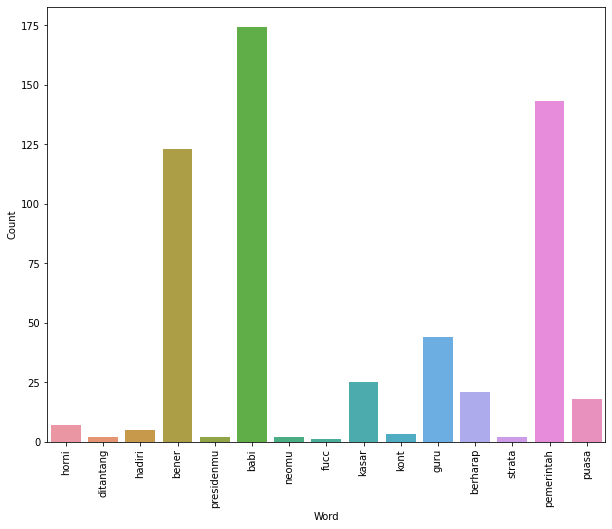

In [39]:
# Memvisualisasikan dengan barplot di library Seaborn.
plt.figure(figsize=(10,8))
ax = sns.barplot(data = Bad_words_Peringkat_15,x = 'Word',y = 'Count')
plt.setp(ax.get_xticklabels(), rotation=90)
plt.show()

# ---------------------------------------------------------------------------------------------------------
# Evaluasi mode (model evaluation)

### Extraction Feature

In [40]:
#Vectorization
#Importing Required Packages

from sklearn.feature_extraction.text import TfidfVectorizer,CountVectorizer
import gensim
df['cleanedText'].head()

0    terimakasih ustadz sudah bersuara tentang radi...
1    maaf sebenarnya twiter pertama kali dbuat buka...
2    anj tai goblok idiot bangsat monyet babi fucc ...
3    hadiri lokakarya kebudayaan daerah bupati rupi...
4                              kaya gini layak tangkap
Name: cleanedText, dtype: object

In [41]:
# Applying Bag of Words Vectorization to the Tweets
# extraction feature menggunakan metode Bag of word

# Metode bag-of-words adalah representasi penyederhanaan yang digunakan dalam pemrosesan bahasa alami

vectorizer = CountVectorizer(stop_words= data)
bow = vectorizer.fit_transform(df['cleanedText'])


In [42]:
#Menerapkan TF-IDF Vectorization ke Tweet

tfidf_vectorizer = TfidfVectorizer(stop_words= data)
tfidf = tfidf_vectorizer.fit_transform(df['cleanedText'])

In [43]:
# Menentukan data 'y (target)' dan 'data X (fitur)'

X = tfidf
y = df['bully']

  (0, 12546)	0.18040784853209393
  (0, 11907)	0.198546994706311
  (0, 16035)	0.18304245710616165
  (0, 16427)	0.21405153230646032
  (0, 20557)	0.14595068167319603
  (0, 20199)	0.1338942357316459
  (0, 5295)	0.16369391805171474
  (0, 8743)	0.16145521927334539
  (0, 13049)	0.18602932996060323
  (0, 17353)	0.14160773790797268
  (0, 16431)	0.15942033347231865
  (0, 5700)	0.15755522700256122
  (0, 17131)	0.7469938666589763
  (0, 2213)	0.198546994706311
  (0, 21479)	0.1550202547603046
  (0, 20400)	0.17397288401905311
  (1, 1580)	0.3011529907558668
  (1, 3806)	0.4798148774727813
  (1, 8683)	0.28710695395861996
  (1, 16299)	0.33356527095264815
  (1, 21225)	0.5010446291840752
  (1, 18149)	0.3441910526635146
  (1, 11200)	0.34040441440974306
  (2, 2364)	0.206826749627679
  (2, 8872)	0.2604620696561484
  :	:
  (10532, 21117)	0.5000486665534826
  (10532, 3197)	0.34287641946203357
  (10533, 1694)	0.4161214817742547
  (10533, 8711)	0.35583907135766674
  (10533, 16876)	0.31185004345284734
  (10533, 21

In [44]:
# Membagi data menjadi 2 bagian yakni train and test================================================

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split (X,y,test_size=0.3, random_state = 7)

print(f'X train: {X_train.shape}')
print(f'X test: {X_test.shape}')
print(f'y train: {y_train.shape}')
print(f'y test: {y_test.shape}')

X train: (7374, 22239)
X test: (3161, 22239)
y train: (7374,)
y test: (3161,)


# Pemodelan Machine Learning Menggunakan 
### - Random Forest Classifier :
Metode klasifikasi random forest adalah metode pohon gabungan pengembangan metode Classification and Regression Tree (CART) dengan menerapkan metode bootstrap aggregating (bagging) dan random feature selection.

### - SVM Linear :
support-vector machine merupakan sebuah algoritma klasifikasi untuk data linear dan non-linear. SVM menggunakan mapping non-linear untuk mentransformasikan training data awal ke dimensi yang lebih tinggi. Kernel linier adalah kernel yang digunakan ketika data yang diklasifikasikan dipisahkan oleh sebuah garis atau hyperline.

In [45]:
# Pemodelan Random Forest
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators=1000, random_state=0)
eval_set_over = [(X_train,y_train),(X_test,y_test)]
classifier = classifier.fit(X_train, y_train)

In [46]:
# Pembuatan Y_Pred (Data Prediksi)
y_prediction_rfc = classifier.predict(X_test)
print(y_prediction_rfc)

['no' 'no' 'no' ... 'no' 'yes' 'no']


In [47]:
from sklearn import svm
from sklearn.multiclass import OneVsRestClassifier
clf = OneVsRestClassifier(svm.SVC(C=100., probability=True, class_weight='balanced', kernel='linear'))
clf_output = clf.fit(X_train, y_train)

In [48]:
y_prediction_svml = clf.predict(X_test)
print(y_prediction_svml)

['no' 'no' 'no' ... 'no' 'yes' 'no']


### Penggunaan Metrics 
- Confusion matrix (matriks kebingungan)adalah gambar atau tabel yang digunakan untuk mendeskripsikan kinerja sebuah penggolongan (klasifikasi). Ini biasanya diekstrak dari dataset pengujian yang kebenaran dasarnya diketahui. 
- Accuracy merupakan rasio prediksi Benar (positif dan negatif) dengan keseluruhan data.
- Recall (Sensitifitas) merupakan rasio prediksi benar positif dibandingkan dengan keseluruhan data yang benar positif.
- Precision adalah kecocokan antara bagian data yang diambil dengan informasi yang Page 4 12 dibutuhkan.
- Specificity adalah proporsi negatif yang benar yang diprediksi dengan benar oleh model.
- classification_report menampilkan precision, Recall, F1, dan skor dukungan untuk model. Untuk mendukung interpretasi dan deteksi masalah yang lebih mudah, laporan ini mengintegrasikan skor numerik dengan peta panas berkode warna.

In [49]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import mean_squared_error
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print('Confusion_Matrix_Random Forest Classifier :')
print(confusion_matrix(y_test,y_prediction_rfc),'\n')
print('Confusion_Matrix_SVM Linear :')
print(confusion_matrix(y_test,y_prediction_svml),'\n')

Confusion_Matrix_Random Forest Classifier :
[[1654  183]
 [ 349  975]] 

Confusion_Matrix_SVM Linear :
[[1551  286]
 [ 350  974]] 



In [50]:
print("Random Forest Classifier :",accuracy_score(y_test,y_prediction_rfc))
print("SVM Linear               :",accuracy_score(y_test, y_prediction_svml))

Random Forest Classifier : 0.8316988294843404
SVM Linear               : 0.798797848782031


Metriks Accuracy diatas adalah milik dari model machine learning Random Forest Classifier dan SVM Linear. didapatkan hasilnya yang lebih baik adalah Random Forest Classifier dengan score 0.8316988294843404 dan milik SVM yang hanya di score 0.798797848782031


In [52]:
Precission_rfc = (1661) / (1661+176)
print("Random Forest Classifier :",Precission_rfc)

Precission_svml = (1539) / (1539+298)
print("SVM Linear               :",Precission_svml)

Random Forest Classifier : 0.9041916167664671
SVM Linear               : 0.8377789874795862


In [51]:
Recall_rfc = (1661) / (1661 + 1005)
print("Random Forest Classifier :",Recall_rfc)

Recall_svml = (1539) / (1539 + 268)
print("SVM Linear               :",Recall_svml)

Random Forest Classifier : 0.6230307576894224
SVM Linear               : 0.8516878804648589


In [53]:
Specificity_rfc = (1005)/ (1005 + 1661)
print("Random Forest Classifier :",Specificity_rfc)

Specificity_svml = (1056 )/ (1056  + 1539)
print("SVM Linear               :",Specificity_svml)
SVM Linear

Random Forest Classifier : 0.37696924231057766
SVM Linear               : 0.4069364161849711


In [54]:
print(classification_report(y_test,y_prediction_rfc))

print(classification_report(y_test,y_prediction_svml))

              precision    recall  f1-score   support

          no       0.83      0.90      0.86      1837
         yes       0.84      0.74      0.79      1324

    accuracy                           0.83      3161
   macro avg       0.83      0.82      0.82      3161
weighted avg       0.83      0.83      0.83      3161

              precision    recall  f1-score   support

          no       0.82      0.84      0.83      1837
         yes       0.77      0.74      0.75      1324

    accuracy                           0.80      3161
   macro avg       0.79      0.79      0.79      3161
weighted avg       0.80      0.80      0.80      3161



Dengan menggunakan metode Random Forest Classifier (RFC) didapatkan accuracy pada data tweet cyberbullying dengan score 0,84. Untuk memperkuat argumen terkait hasil RFC, penelitian ini menggunakan pengujian terhadap metode lain yaitu penerapan Super Vector Classifier (SVM) sebagai algoritma klasifikasi. Hasil accuracy yang diperoleh dengan metode SVM dengan score 0,82. Dengan demikian, metode RFC memiliki kelebihan lebih baik daripada SVM, maka dari itu digunakan metode RFC dalam penerapan klasifikasi pada text mining untuk pengklasifikasian. 

Model yang dihasilkan dapat digunakan dalam sistem komputer. Jika posting dan komentar oleh pengguna Twitter berisi tweet yang terkait dengan cyberbullying, dapat menerima peringatan untuk diblokir sementara atau diblokir permanen sesuai dengan kebijakan Twitter. Apabila peringatan diabaikan tiga kali atau sesuai kebijakan yang diberikan, tweet akan diblokir secara sepihak.